In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pathresults = "../results/"
#pathresults = "/DUMUXDune27/DUMUX/dumux-rosi/python/paperSc/results/"
data_file_delimiter = ","

In [3]:
import plotnine

from plotnine import (
    ggplot,
    aes,
    after_stat,
    geom_histogram,
    facet_wrap,
    facet_grid,
    coord_flip,
    scale_y_continuous,
    scale_y_sqrt,
    scale_y_log10,
    scale_fill_manual,
    theme_bw,
    theme_xkcd

)

In [4]:
def getVal(mypath, filename, header="infer",names = None):
    fullpath = pathresults +mypath+filename
    if names is None:
        cst = pd.read_csv(fullpath,delimiter=data_file_delimiter, header = header).dropna(how= "all", axis=1)
    else:
        cst = pd.read_csv(fullpath,delimiter=data_file_delimiter, header = header, names = names).dropna(how= "all", axis=1)
    return cst
def get_last_line_as_numpy_array(file_path, dtype = float):
    with open(pathresults +file_path, 'r') as file:
        # Read all lines
        lines = file.readlines()

        # Check if there are any lines in the file
        if not lines:
            raise ValueError("The file is empty")

        # Get the last line
        last_line = lines[-1].strip()

        # Split the last line by commas and convert to NumPy array
        array_from_last_line = np.array(last_line.split(','), dtype=dtype)

        return array_from_last_line

In [24]:
#def get_gIds(filepath):
#folder_path = 'none_55_0_10to11_20mn_0s_5/'

def list_files_with_prefix(folder_path, prefix):
    file_names = []
    for file_name in os.listdir(pathresults+folder_path):
        if file_name.startswith(prefix):
            file_names.append(file_name)
    return file_names
def getCylIdx(folder_path):
    namelist = list_files_with_prefix(folder_path, "Cyl_watercontent_")
    idxlist = np.full(len(namelist),-1,dtype = int)
    for nn, nl in enumerate(namelist):
        match = re.search(r'\d+', nl)
        number_str = match.group()
        number_int = int(number_str)
        idxlist[nn] = number_int
    return idxlist

In [ ]:
rr

In [73]:
# cylinder max konz (per cell)
def getData_(name, cid,gId,path2file):
    fileName = "Cyl_cellVol_"+str(gId)+".txt"
    cVol = get_last_line_as_numpy_array(path2file+fileName, dtype = float)
    if cid <= 9:
        if cid <= 2 and cid > 0:
            fileName = "Cyl_watercontent_"+str(gId)+".txt"
            theta = get_last_line_as_numpy_array(path2file+fileName, dtype = float)
            cVol *= theta
        fileName = name+str(gId)+".txt"
        Q1 = get_last_line_as_numpy_array(path2file+fileName, dtype = float)
        konz = sum(Q1)/sum(cVol) #mol/cm3 or cm3/cm3
        return konz
    return sum(cVol)

def getData():
    
    nToGet = 9+3+1 #elements + 3d coordinates of y node+vol
    nKonz = 9
    dictXYZ = {9:'X',10:'Y',11:'Z'}
    GiniAll = [[[] for i in range(99)] for ii in range(nToGet)]
    for pSet in range(99):
        print(pSet,end =", ")

        path2file = 'none_55_'+str(pSet)+'_10to11_20mn_0s_5/'
        #nodes_X =get_last_line_as_numpy_array(path2file+"nodes_X.txt", dtype =float)
        #nodes_Y =get_last_line_as_numpy_array(path2file+"nodes_Y.txt", dtype =float)
        #nodes_Z =get_last_line_as_numpy_array(path2file+"nodes_Z.txt", dtype =float)
        #dictXYZ = {10:nodes_X,11:nodes_Y,12:nodes_Z}
        rr = getCylIdx(path2file)

        for cid in range(nKonz):
            Ginits = np.full(len(rr),np.nan)
            for idx, gId in enumerate(rr):
                if cid == 0:
                    namedata = "Cyl_watercontent_"
                elif cid <= nKonz:
                    namedata = "Cyl_content"+str(cid)+"_"
                Ginits[idx] = getData_(namedata, cid, gId,path2file)                
            GiniAll[cid][pSet] = Ginits
        for cid in range(nKonz,nToGet-1):
            nodes_ =get_last_line_as_numpy_array(path2file+"nodes_"+dictXYZ[cid]+".txt", dtype =float)
            GiniAll[cid][pSet] = nodes_[rr+1]#seg idx to y-idx
        cid = nToGet -1
        for idx, gId in enumerate(rr):
            GiniAll[cid][pSet] = getData_('', cid, gId,path2file)  
    return GiniAll #cid pSet rr
    

In [74]:
GiniAll = getData()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 

In [28]:
np.array(GiniAll).shape

/tmp/ipykernel_1451141/2873905747.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


(12, 99)

In [75]:
# get param set
paramsets =  pd.read_csv('../output_random_rows.csv')
paramsets = paramsets.drop(paramsets.columns.tolist()[-1],axis=1)
outputvalsname =  ['wat','cs','cl','coa','cod','cca','ccd','css2','co2','yX','yY','yZ','vol']
column_names = outputvalsname + paramsets.columns.tolist()
df = pd.DataFrame(columns=column_names)

for pset in range(99):
    N = GiniAll[0][pset].shape[0]
    rows_to_duplicate_df = pd.DataFrame(paramsets.iloc[pset]).T
    duplicated_rows_df = rows_to_duplicate_df.loc[np.repeat(rows_to_duplicate_df.index.values, N)]
    # Duplicate the specific rows N times
    #print('init dupl row shape',duplicated_rows_df.shape)
    for jj, outVn in enumerate(outputvalsname):
        duplicated_rows_df[outVn] = GiniAll[jj][pset]
        #print('adding',jj,outVn,duplicated_rows_df.shape,len(GiniAll[jj][pset]))

    # Concatenate the original DataFrame with the duplicated specific rows
    df = pd.concat([df, duplicated_rows_df], ignore_index=True)

In [76]:
df.shape

(23157, 40)

In [77]:
df['co'] = df['coa']+df['cod']
df['cc'] = df['cca']+df['ccd']

In [78]:
df.to_pickle("./cyl10to11_allroots1.pkl") 

In [ ]:
df['']

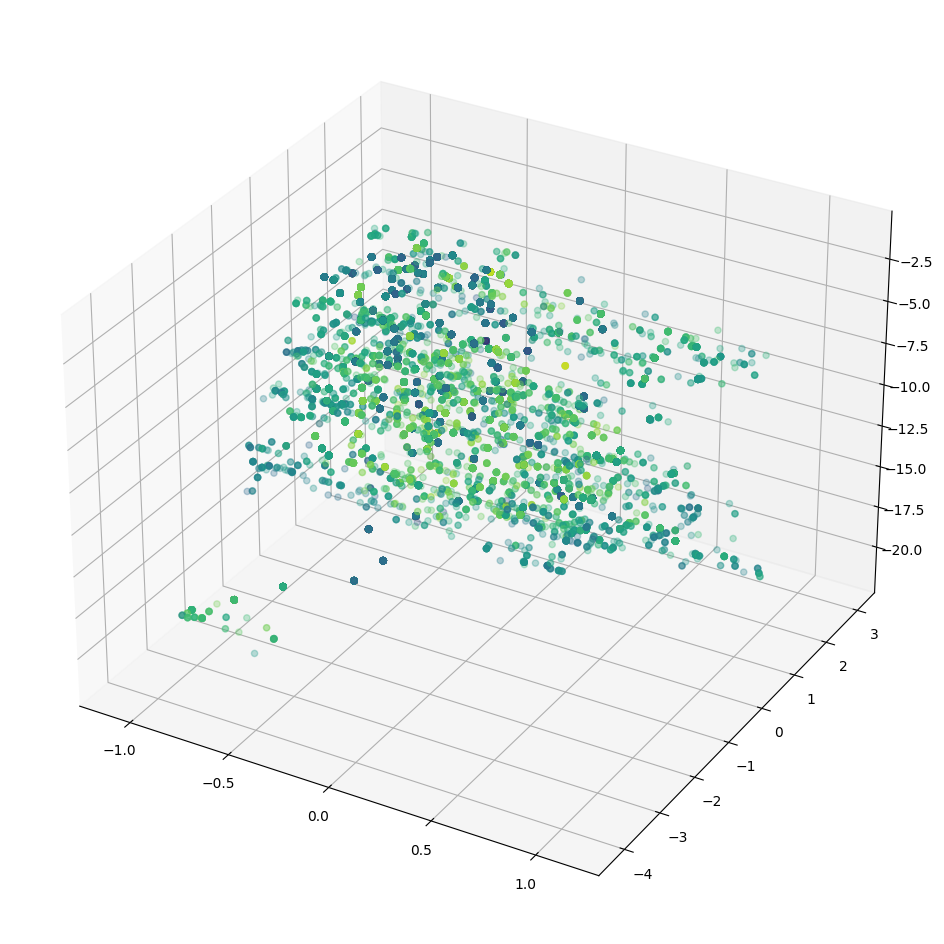

In [33]:

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')

ax.scatter(df['yX'], 
           df['yY'], 
           df['yZ'],
          c = np.log(df['cs']), alpha=0.3)
plt.show()

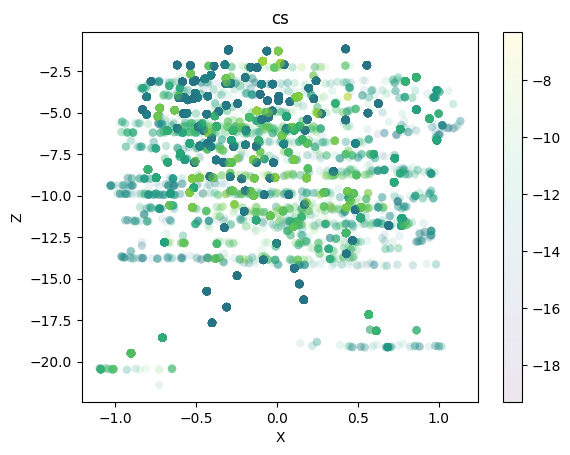

In [34]:


plt.scatter((df['yX']),(df['yZ']), #np.log(df['cc']),np.log(df['co']), 
            c=np.log(df['cs']),
            alpha=0.1, edgecolors ='none')
plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':100})
plt.title('cs')
plt.colorbar()
plt.xlabel('X')
plt.ylabel('Z')
plt.show()

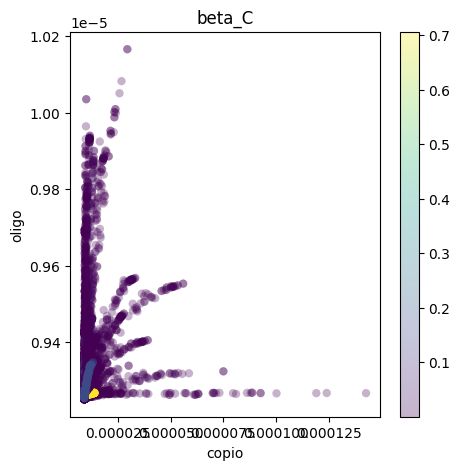

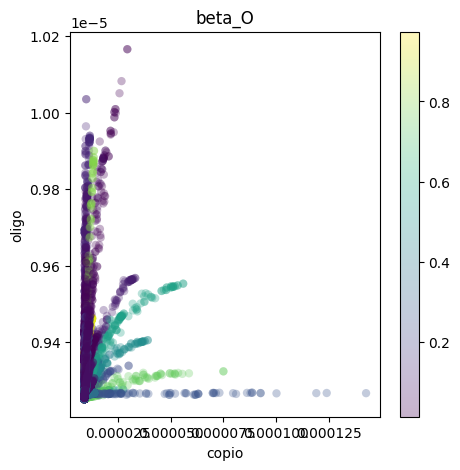

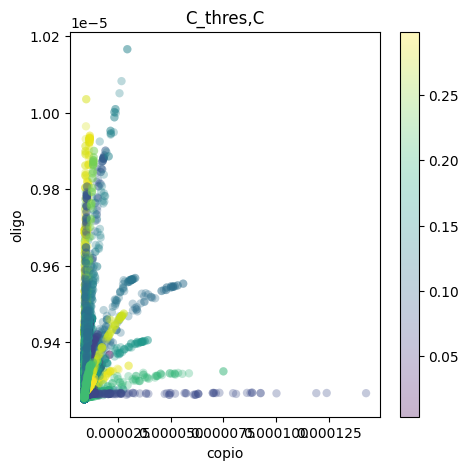

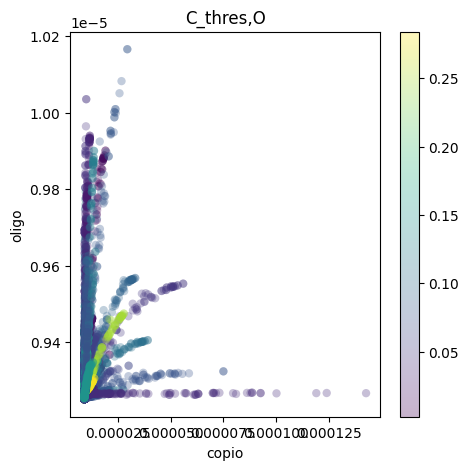

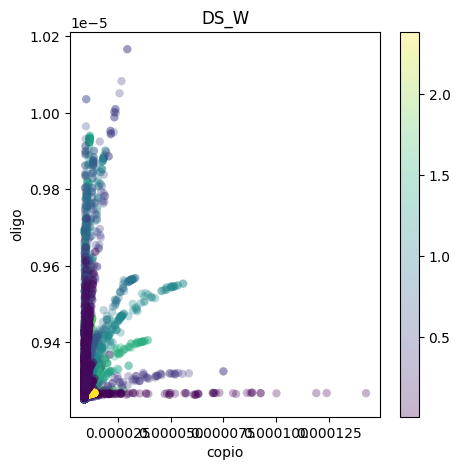

...

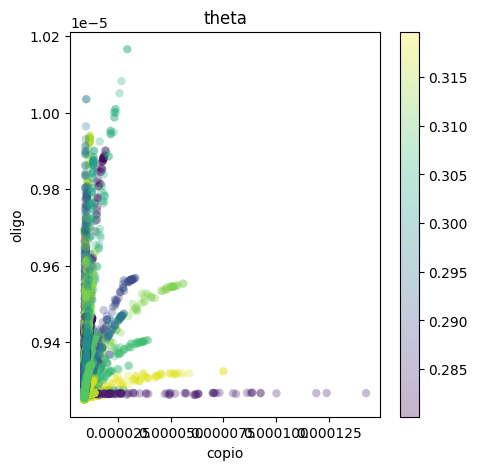

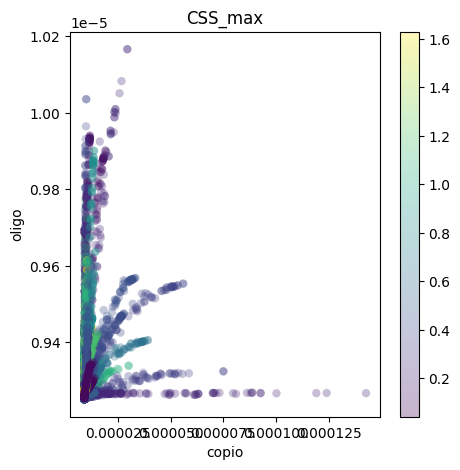

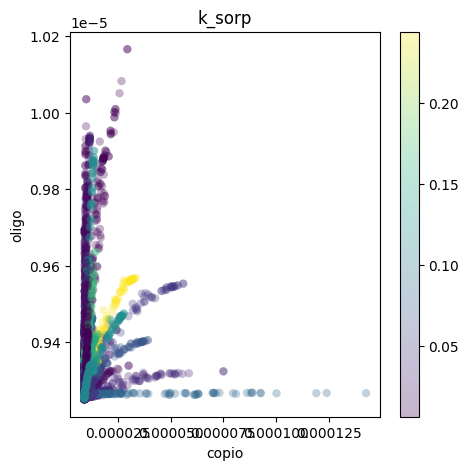

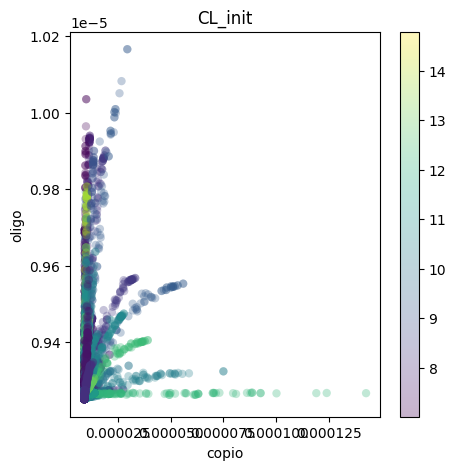

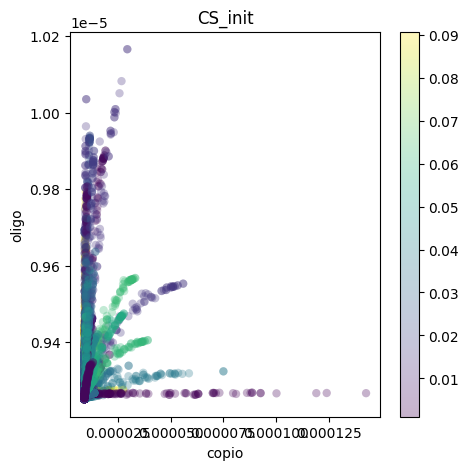

In [35]:
for nn in paramsets.columns.tolist():
    plt.scatter((df['cc']),(df['co']), #np.log(df['cc']),np.log(df['co']), 
                c=df[nn],
                alpha=0.3, edgecolors ='none')
    plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':100})
    plt.title(nn)
    plt.colorbar()
    plt.xlabel('copio')
    plt.ylabel('oligo')
    plt.show()

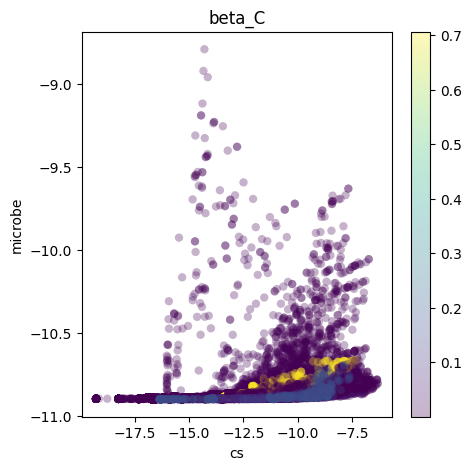

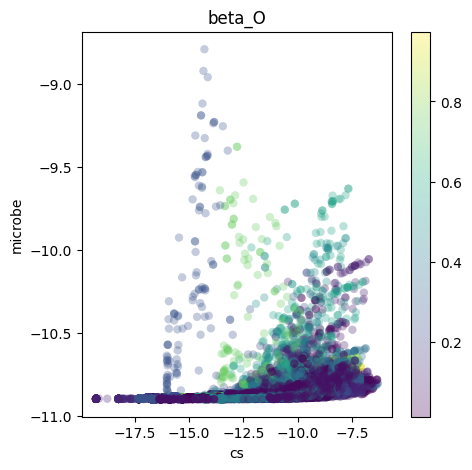

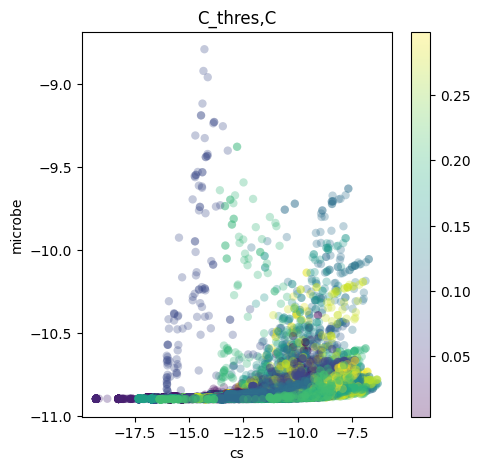

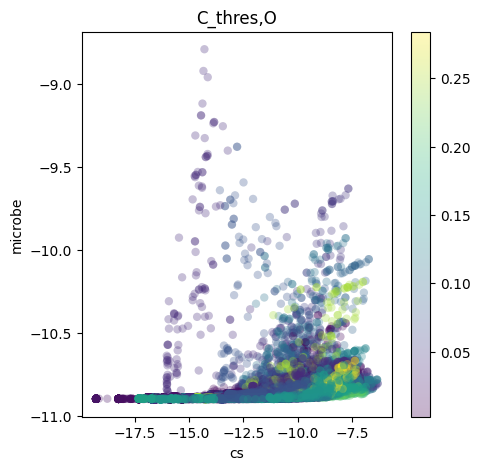

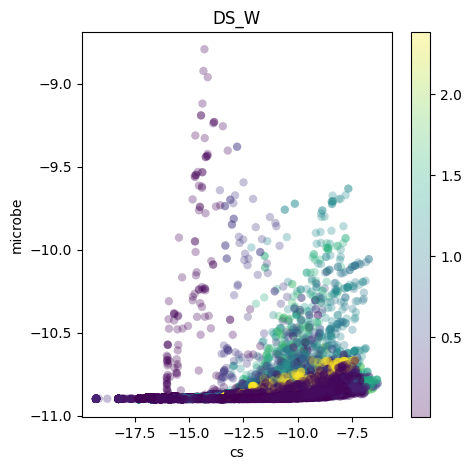

...

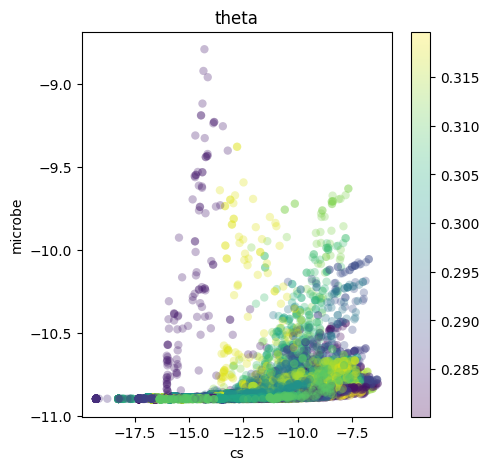

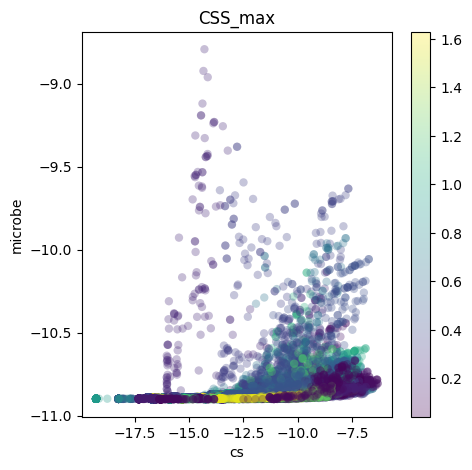

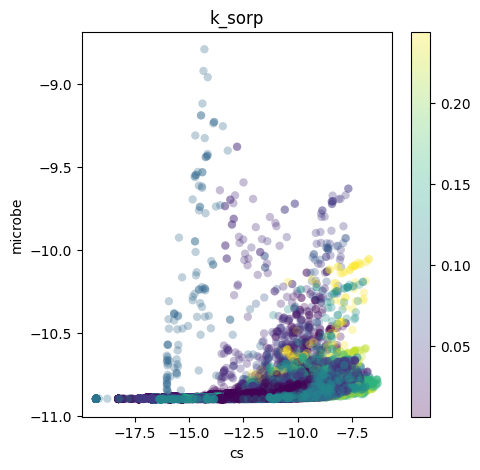

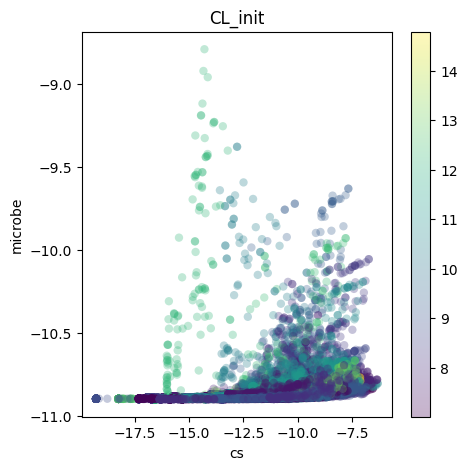

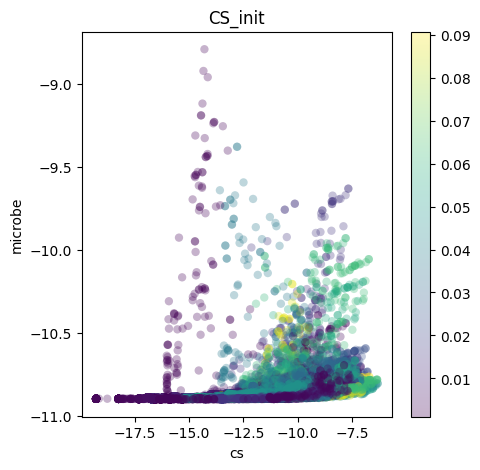

In [36]:
for nn in paramsets.columns.tolist():
    plt.scatter(np.log(df['cs']),np.log(df['co']+df['cc']), 
                c=df[nn],
                alpha=0.3, edgecolors ='none')
    plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':100})
    plt.title(nn)
    plt.colorbar()
    plt.xlabel('cs')
    plt.ylabel('microbe')
    plt.show()

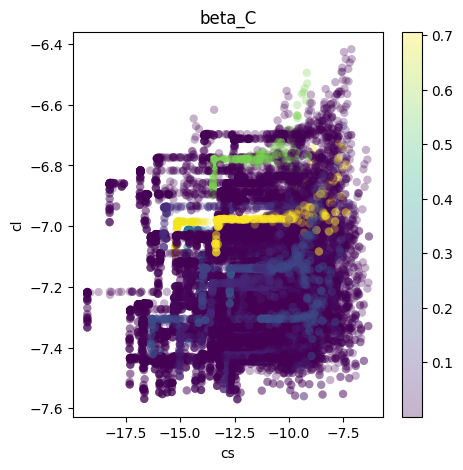

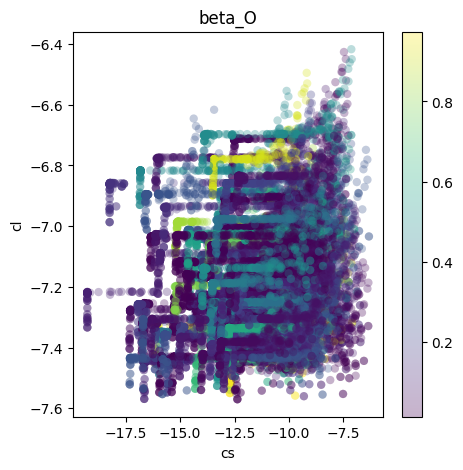

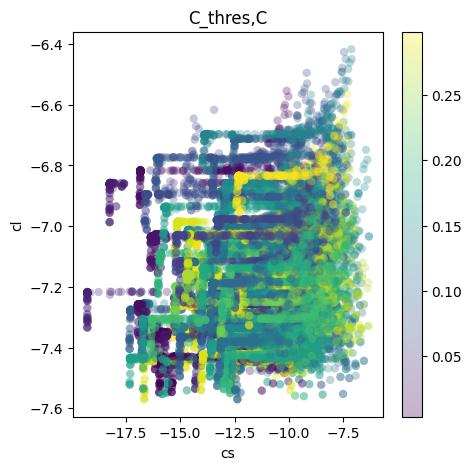

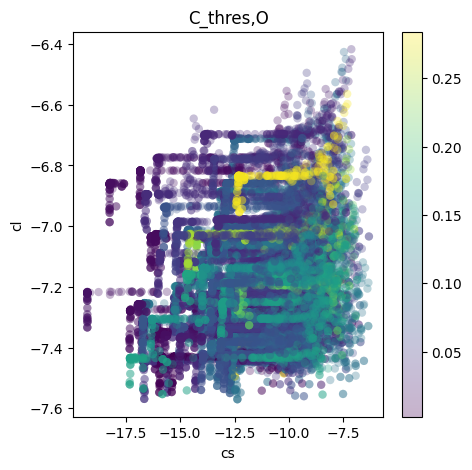

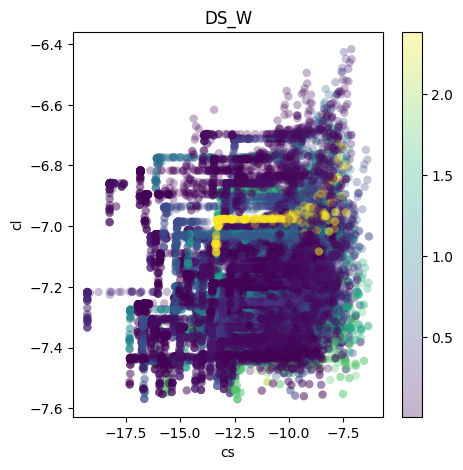

...

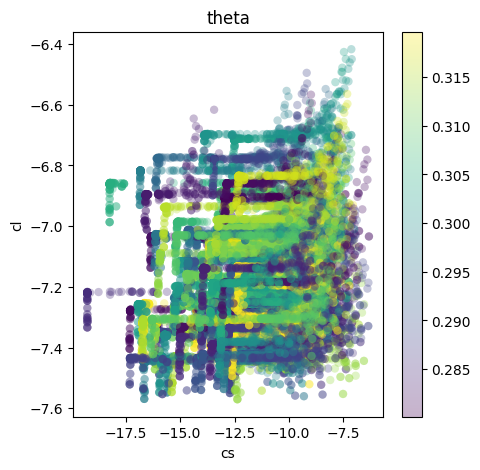

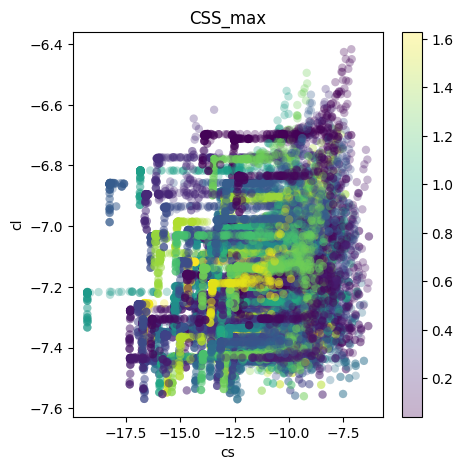

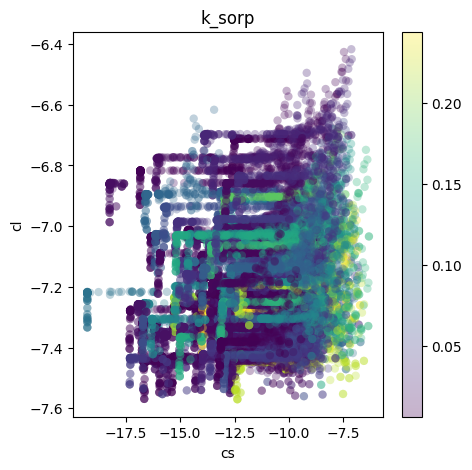

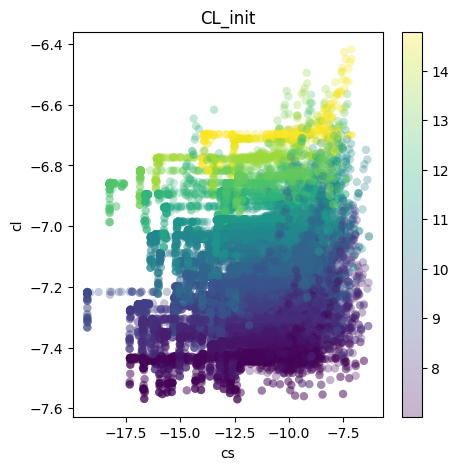

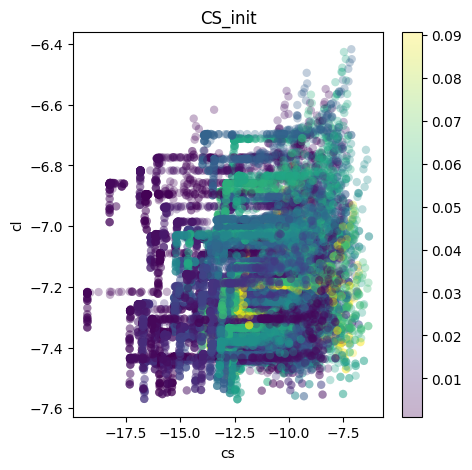

In [37]:
for nn in paramsets.columns.tolist():
    plt.scatter(np.log(df['cs']),np.log(df['cl']), 
                c=df[nn],
                alpha=0.3, edgecolors ='none')
    plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':100})
    plt.title(nn)
    plt.colorbar()
    plt.xlabel('cs')
    plt.ylabel('cl')
    plt.show()

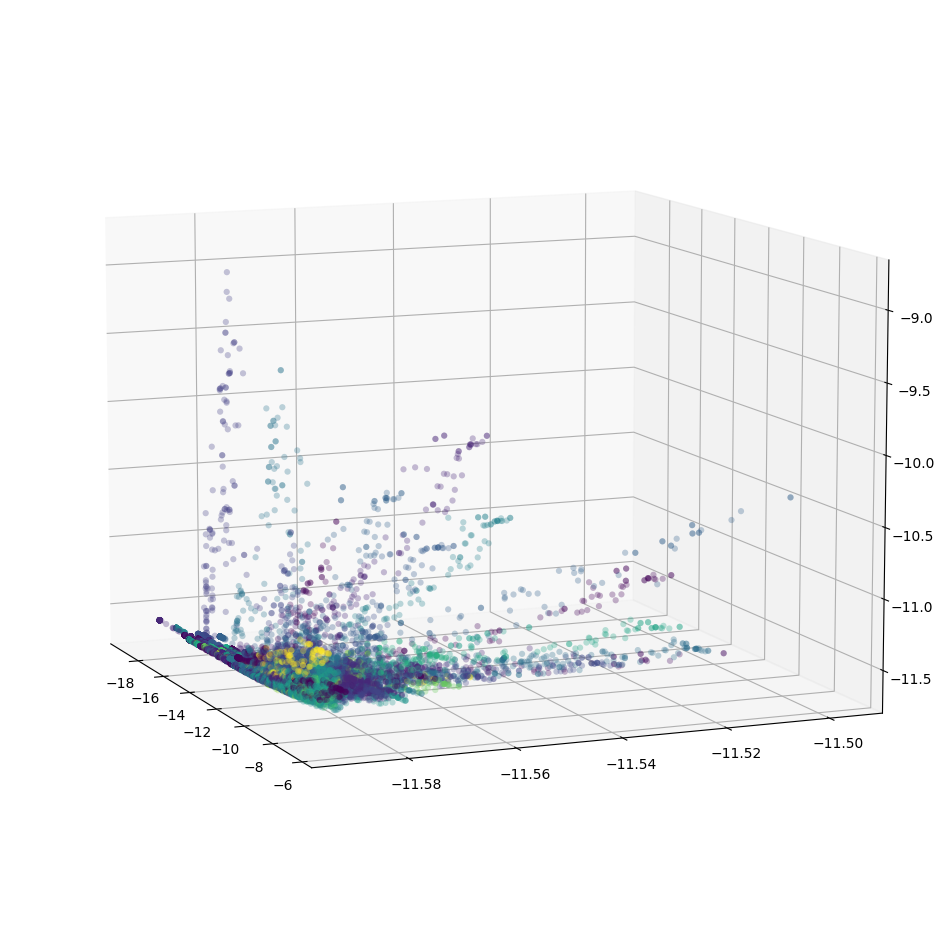

In [65]:
%matplotlib inline
for nn in [paramsets.columns.tolist()[0]]:
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection='3d')
    ax.view_init(elev=10, azim=-45/2, roll=0)
    ax.scatter(np.log(df['cs']), 
               np.log(df['co']), 
               np.log(df['cc']),
              c = np.log(df[nn]), alpha=0.3, edgecolors ='none')
    plt.show()

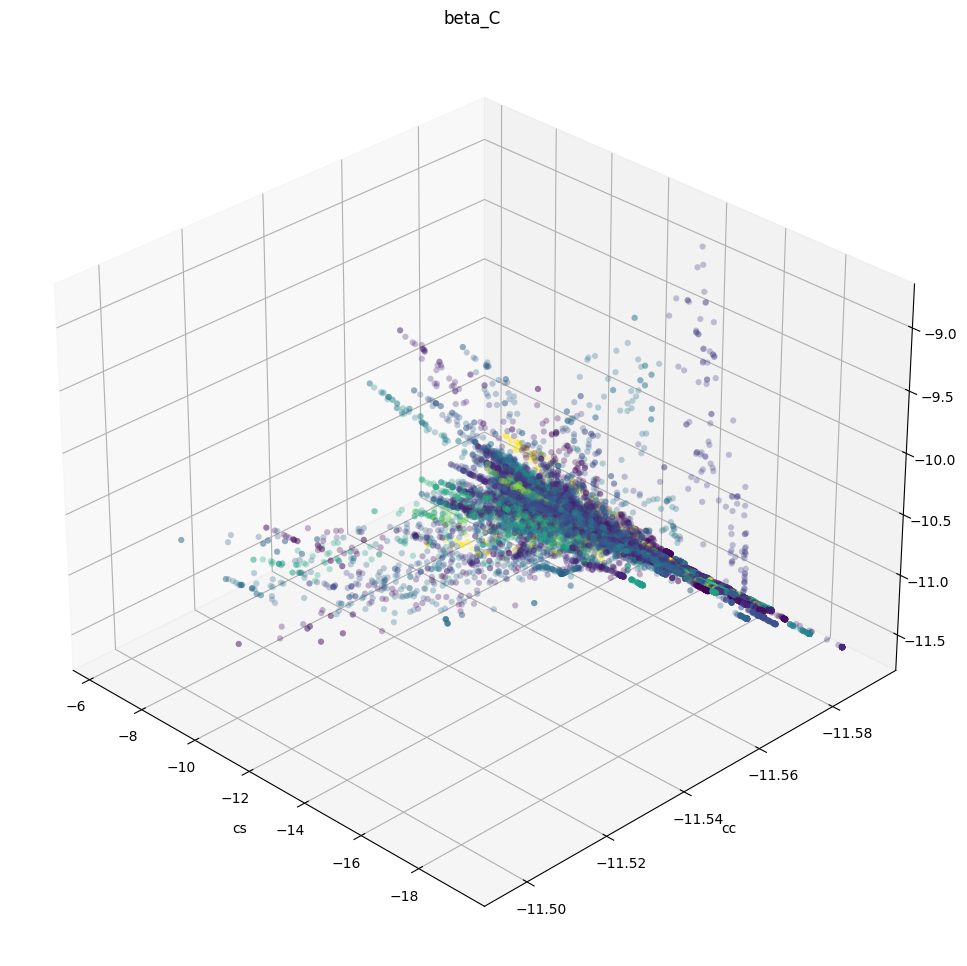

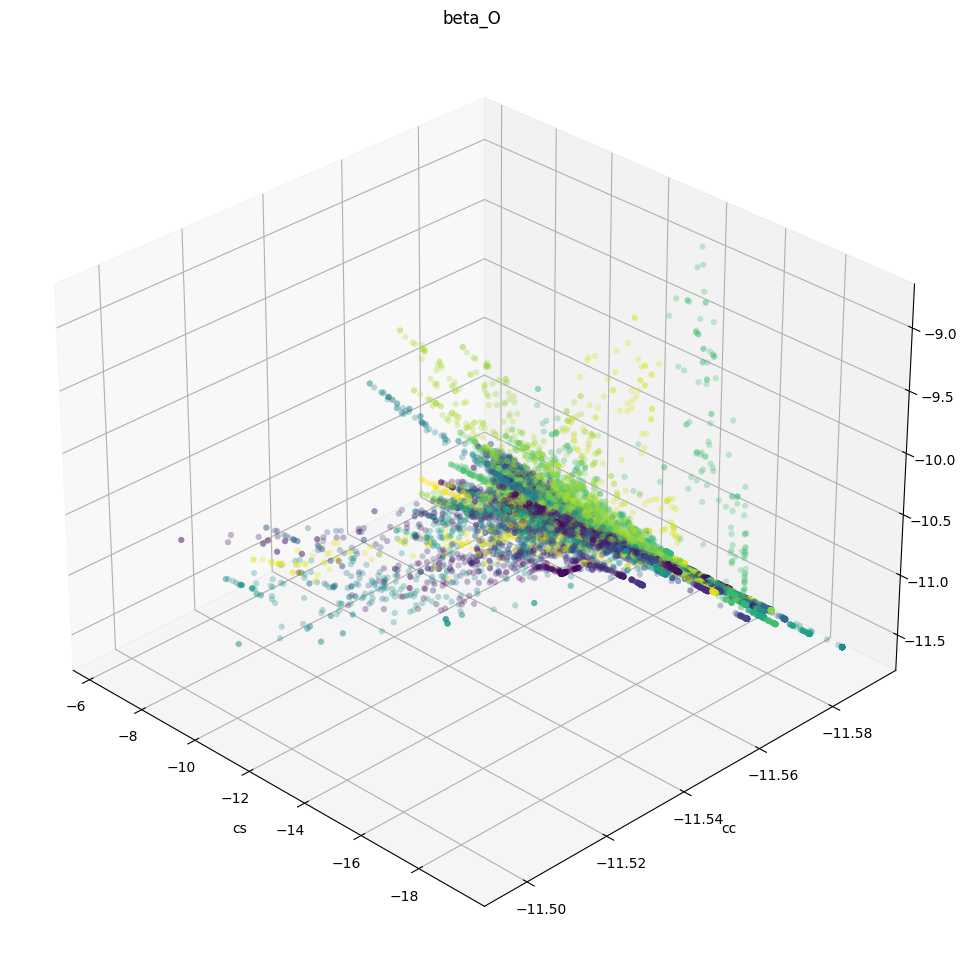

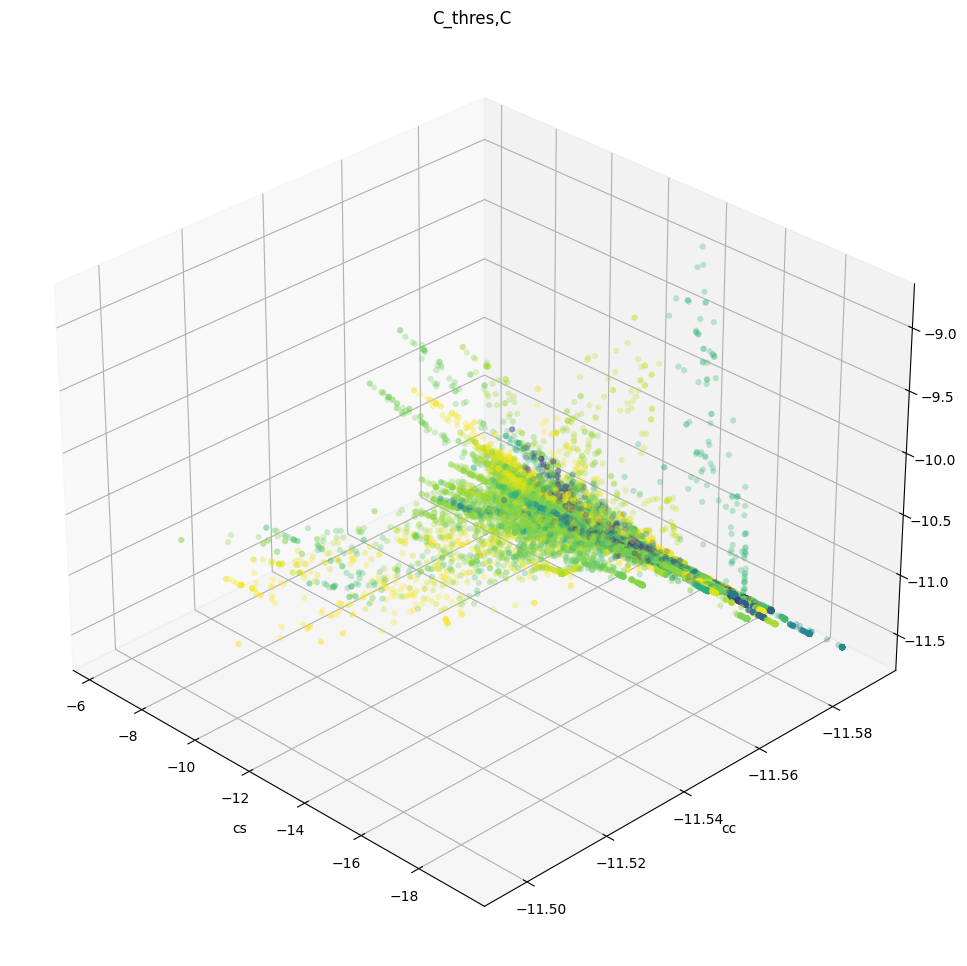

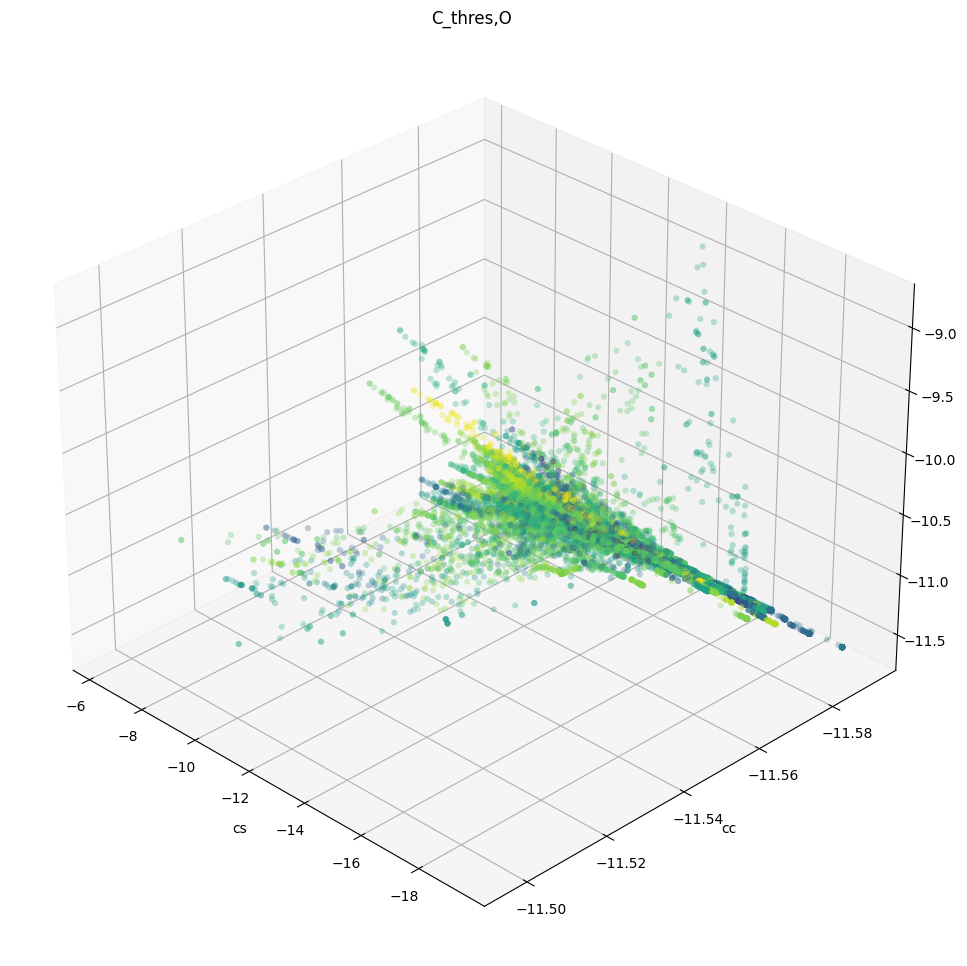

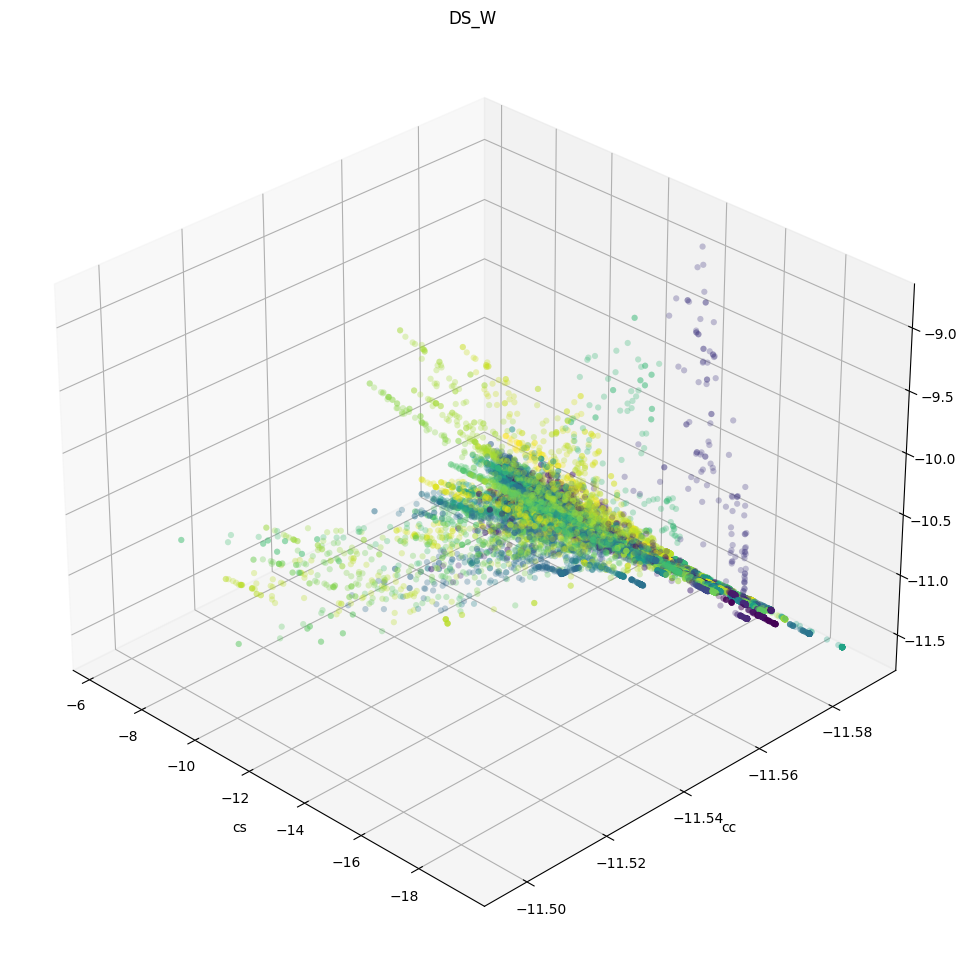

...

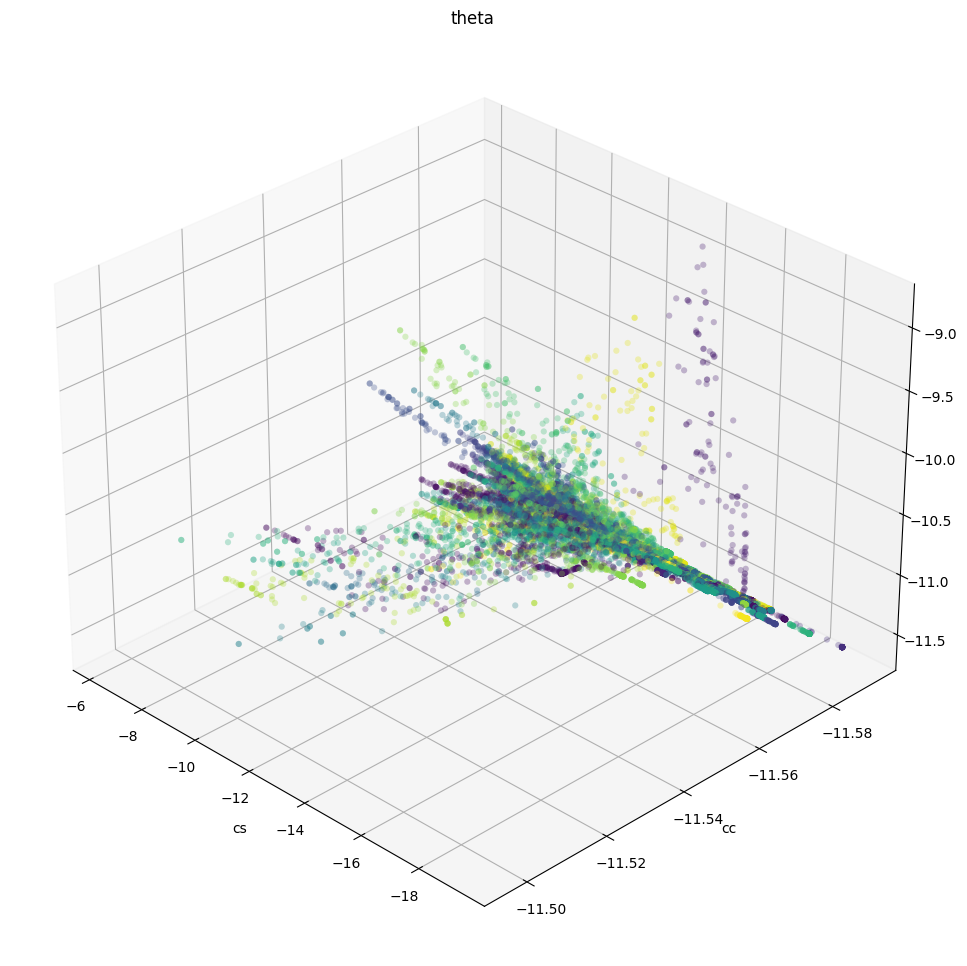

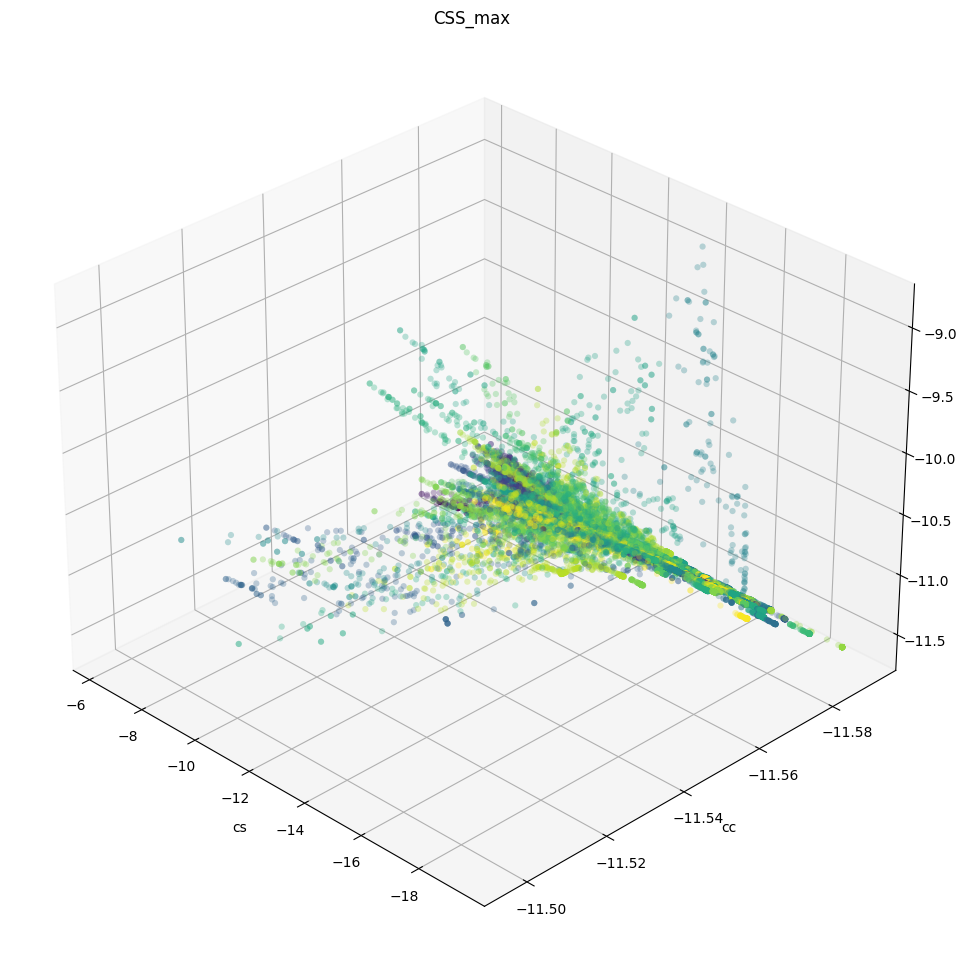

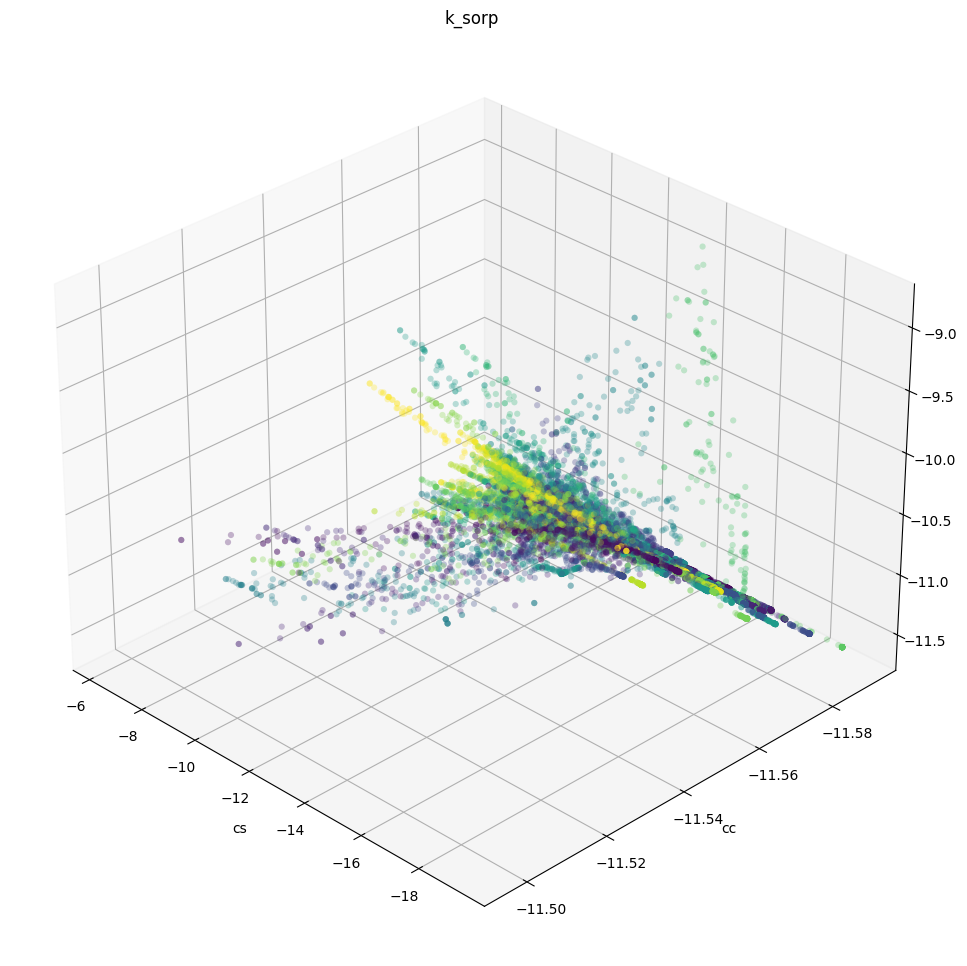

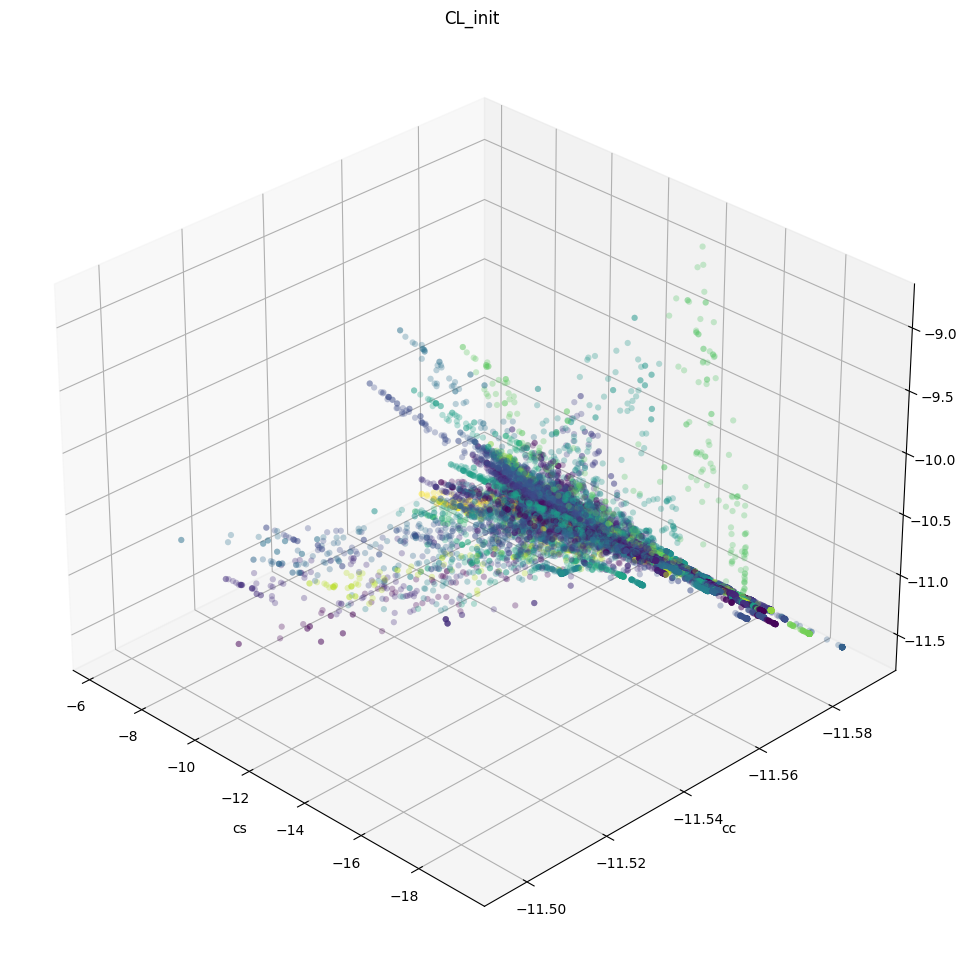

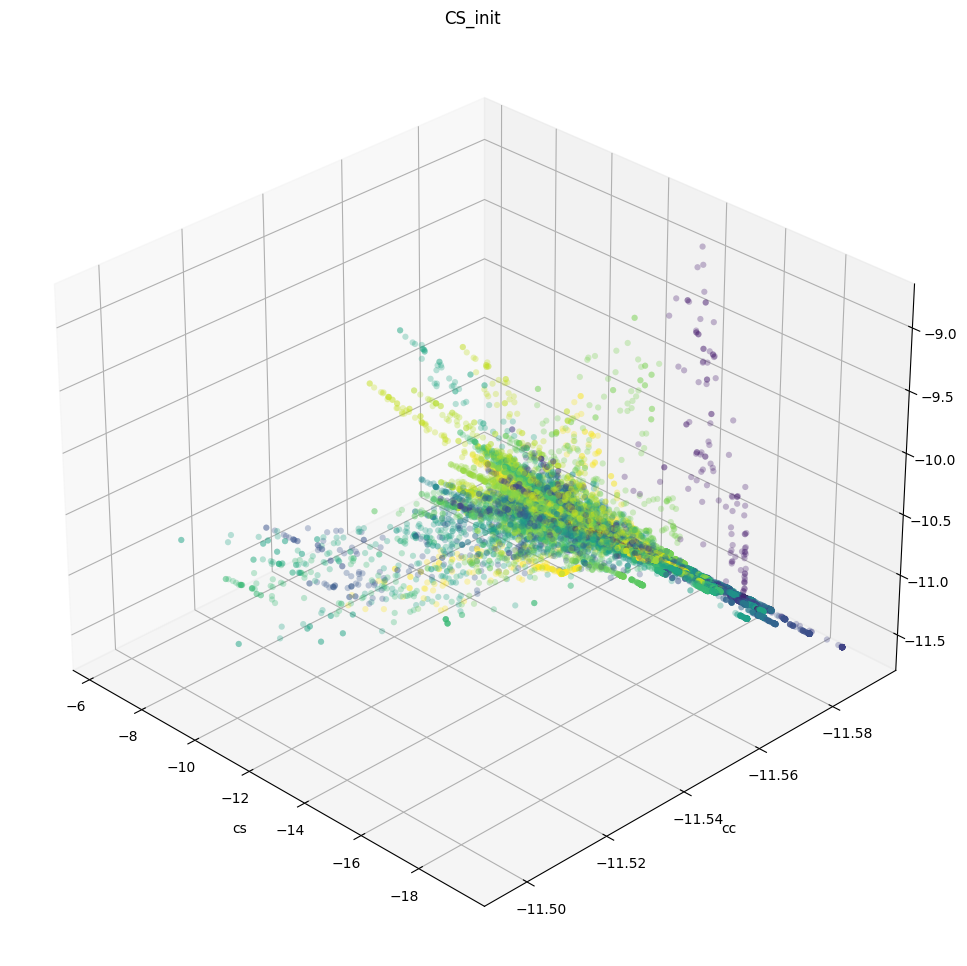

In [72]:

for nn in paramsets.columns.tolist():
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection='3d')
    ax.view_init(elev=30, azim=135, roll=0)
    ax.set_title(nn)
    #ax.colorbar()
    ax.set_xlabel('cs')
    ax.set_ylabel('co')
    ax.set_ylabel('cc')
    ax.scatter(np.log(df['cs']), 
               np.log(df['co']), 
               np.log(df['cc']),
              c = np.log(df[nn]), alpha=0.3, edgecolors ='none')
    plt.show()